In [2]:
# Initialize Otter
import otter
grader = otter.Notebook("hwk3-task1-spills.ipynb")

# Task 1: Visualizing oil spills in NY State

## Instructions

- First, update the following cell to have a link to *your* Homework 3 GitHub repository:

https://github.com/kpaya/eds220-hwk3


- Review the [complete rubric for this task](https://docs.google.com/document/d/1Ce4EO3MEHW5uLks4x8BECWlkim2bcmxB4f8Qo4z26z8/edit?usp=sharing) before starting.

- **Meaningful commits should be made every time you finish a major step.** We'll check your repository and view the commit history.

- Comment mindfully in a way that enriches your code. Comments should follow best practices.

- **Do not update the top cell with the `otter` import**, this is used internally for grading.

- Delete all the comments initially included in this notebook (ex: `# Your code here`).


## About the data
In this task you will use two datsets:

### First dataset: oil spills data

The first dataset contains information about [spilling incidents in the state of New York](https://data.ny.gov/Energy-Environment/Spill-Incidents/u44d-k5fk). 
You can find extra information and metadata for this dataset in the `NYSDEC_SpillIncidents_Overview.pdf` and `NYSDEC_SpillIncidents_DataDictionary.pdf` documents available at the portal.

### Second dataset: TIGER shapefile

The second dataset is the [the 2023 Counties (and equivalent) TIGER shapefile](https://www.census.gov/geographies/mapping-files/time-series/geo/tiger-line-file.2022.html#list-tab-790442341) from the Census Bureau. You can check the [metadata for all the TIGER shapefiles here](https://www.census.gov/programs-surveys/geography/technical-documentation/complete-technical-documentation/tiger-geo-line.html). 


## 1. File management
a. Create a `data/` directory inside your `eds220-hwk3` directory. If you download any data, it should be transferred into this folder. 

b. Add the `data/` directory to your `.gitignore` file and push your changes. This is IMPORTANT: the datasets we'll be working with are large and they will most likely jam your `git` workflow if you try to push them. Your `data/` directory should not be in your GitHub repository.

## 2. Datasets description
Read the metadata for both datsets and write a description about each one. Indicate the date sources and date of access.


**NY Shapefile**

U.S. Census Bureau. TIGER/Line Shapefiles. U.S. Census Bureau. Retrieved November 4th, 2024, from https://www.census.gov/geographies/mapping-files/time-series/geo/tiger-line-file.2022.html#list-tab-790442341

The TIGER/Line Shapefiles are extracts of selected geographic and cartographic information from the Census Bureau's Master Address File (MAF)/Topologically Integrated Geographic Encoding and Referencing (TIGER) System. The shapefiles include information for the fifty states. Feature shapefiles represent the point, line, and polygon features in the MAF/TIGER System (e.g., roads and rivers). Relationship files contain additional attribute information users can join to the shapefiles. Both the feature shapefiles and relationship files reflect updates made in the database through August 2024.

**Oil Spill Data**

New York State Department of Environmental Conservation. Spill incidents. Retrieved November 4th, 2024, from https://data.ny.gov/Energy-Environment/Spill-Incidents/u44d-k5fk

This dataset contains records of spills of petroleum and other hazardous materials. Under State law and regulations, spills that could pollute the lands or waters of the state must be reported by the spiller (and, in some cases, by anyone who has knowledge of the spill

## 3. Import libraries

In [44]:
# Import libraries
import pandas as pd
import os
from pandas.api.types import is_string_dtype, is_numeric_dtype
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np

## 4. Import data 
In the next cell:

- Import the NY spills data as a variable named `spills`. 
- Import the US counties data as a variable named `counties`.

If you are using file paths to access the data, these should be constructed using the `os` package.

In [4]:
# Read data
spill=pd.read_csv("data/Spill_Incidents_20241103.csv")
fp=os.path.join('data','tl_2023_us_county','tl_2023_us_county.shp')
counties=gpd.read_file(fp)

ERROR 1: PROJ: proj_create_from_database: Open of /opt/anaconda3/share/proj failed


## 5. Prepare spills data

This section refers to the `spills` dataframe. 
Check the outputs carefully, they will give you information you will need to use in the next exercises.

### 5.A. Exploration

In the next cells:

a. Check the dataframe's head.

b. Check the data types of the columns.

c. Check the unique values in the `material_family` column.

d. Check the unique values in the `county` column.

You can add other cells for preliminary data exploration.

In [ ]:
# Replace spaces with underscores and convert to lowercase

spill.columns = spill.columns.str.replace(' ', '_').str.lower()

In [107]:
# Display the first few rows of the DataFrame to get an overview of the data

spill.head()

,spill_number,program_facility_name,street_1,street_2,locality,county,zip_code,swis_code,dec_region,spill_date,received_date,contributing_factor,waterbody,source,close_date,material_name,material_family,quantity,units,recovered
0,107132,MH 864,RT 119/MILLWOOD RD,NaN,ELMSFORD,Westchester,NaN,6000,3,2001-10-10,10/10/2001,Unknown,NaN,Unknown,10/15/2001,unknown material,Other,10.0,Gallons,0.0
1,405586,BOWRY BAY,WATER POLL CONTROL,NaN,QUEENS,Queens,NaN,4101,2,2004-08-21,08/21/2004,Other,EAST RIVER,Unknown,09/17/2004,raw sewage,Other,0.0,NaN,0.0
2,405586,BOWRY BAY,WATER POLL CONTROL,NaN,QUEENS,Queens,NaN,4101,2,2004-08-21,08/21/2004,Other,EAST RIVER,Unknown,09/17/2004,raw sewage,Other,0.0,Pounds,0.0
3,204667,POLE 16091,GRACE AVE/BURKE AVE,NaN,BRONX,Bronx,NaN,301,2,2002-08-02,08/02/2002,Equipment Failure,NaN,Commercial/Industrial,10/28/2002,transformer oil,Petroleum,1.0,Gallons,0.0
4,210559,POLE ON,FERDALE LOMIS RD / RT 52,NaN,LIBERTY,Sullivan,NaN,5336,3,2003-01-20,01/20/2003,Traffic Accident,NaN,Commercial/Industrial,01/22/2003,transformer oil,Petroleum,6.0,Gallons,6.0


In [108]:
# Check the data types of each column in the DataFrame

spill.dtypes

spill_number                      int64
program_facility_name            object
street_1                         object
street_2                         object
locality                         object
county                           object
zip_code                         object
swis_code                         int64
dec_region                        int64
spill_date               datetime64[ns]
received_date                    object
contributing_factor              object
waterbody                        object
source                           object
close_date                       object
material_name                    object
material_family                  object
quantity                        float64
units                            object
recovered                       float64
dtype: object

In [8]:
# Get the unique values in the 'material_family' column to understand the categories of materials

spill['material_family'].unique()

array(['Other', 'Petroleum', 'Hazardous Material', 'Oxygenates'],
      dtype=object)

In [9]:
# Get the unique values in the 'county' column to see the geographic distribution of spills

spill['county'].unique()

array(['Westchester', 'Queens', 'Bronx', 'Sullivan', 'Cortland',
       'New York', 'Ulster', 'Kings', 'Orange', 'Dutchess', 'Onondaga',
       'Saratoga', 'Cayuga', 'Oswego', 'Warren', 'Niagara', 'Rockland',
       'Nassau', 'Jefferson', 'Schenectady', 'Albany', 'Monroe',
       'Schuyler', 'St Lawrence', 'Richmond', 'Clinton', 'Lewis', 'Essex',
       'Chenango', 'Erie', 'Livingston', 'Wayne', 'Suffolk', 'Orleans',
       'Ontario', 'Genesee', 'Otsego', 'Tompkins', 'Madison', 'Chemung',
       'Seneca', 'Oneida', 'Broome', 'Hamilton', 'Washington', 'Franklin',
       'Columbia', 'Fulton', 'Herkimer', 'Schoharie', 'Rensselaer',
       'Montgomery', 'Putnam', 'Delaware', 'New Jersey - Region 2',
       'Steuben', 'Tioga', 'Chautauqua', 'Cattaraugus', 'Wyoming',
       'Yates', 'Greene', 'Pennsylvania - Region 9', 'Allegany',
       'New Jersey - Region 3 (N)', 'Cattaraugus Indian Reservation',
       'New Jersey - Region 3 (T)', 'Canada - Region 6',
       'Canada - Region 9', 'Pennsyl

<!-- BEGIN QUESTION -->

f. Use the next markdown cell to explain what information you obtained from the preliminary exploration. Use complete sentences.

<!-- END QUESTION -->

*Your answer here.*

<!-- END QUESTION -->

In my preliminary exploration of the spill DataFrame, I first realized that the column names needed to be standardized by replacing spaces with underscores and converting them to lowercase. This normalization helps streamline data manipulation.

Using the head() method, I examined the first few rows of the DataFrame, allowing me to get an overview of the data structure and the types of information contained within each column.

Next, I checked the data types of each column with dtypes, which provided insights into the nature of the data (e.g., numeric, categorical, etc.)

I also checked the unique values in the material_family column, which revealed there's only 4 different categories of materials. 

Finally, I looked at the unique values in the county column, which showed the geographic distribution of spill incidents. It only showed the Northeast regions of North America.

### 5.B. Cleaning
a. Simplify column names as needed.

b. Update column data types as needed. If you're not sure if any data types are needed at this point, you may come back later to this cell.

In [109]:
# Replace spaces with underscores and convert to lowercase

spill.columns = spill.columns.str.replace(' ', '_').str.lower()

In [110]:
# Convert the column to a datetime format

spill['spill_date'] = pd.to_datetime(spill['spill_date'])

### 5.C. Data selection

a. Select data about petroleum spills that took place between January 1st 2023, and October 31st 2023 (including both dates). Store it in a variable named `petr_23`. The data selection should occur in a single line. You may add cells as needed.

In [13]:
# Convert 'spill_date' to datetime & filter the DataFrame between two dates

petr_23 = spill[(spill['material_family'] == 'Petroleum') & 
                 (spill['spill_date'] >= '01/01/2023') & 
                 (spill['spill_date'] <= '31/10/2023')]

/opt/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:52: UserWarning: Parsing '31/10/2023' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  return self._cmp_method(other, operator.le)


<!-- BEGIN QUESTION -->

b. Use `print()` and f-strings to print messages verifying that `petr_23` only has data for 2023 and from January through October.
HINT: [pandas.Series.dt.year](https://pandas.pydata.org/docs/reference/api/pandas.Series.dt.year.html) and [pandas.Series.dt.month](https://pandas.pydata.org/docs/reference/api/pandas.Series.dt.month.html).

In [14]:
# b. Visualize results

print(petr_23)

        spill_number program_facility_name             street_1 street_2  \
220          2301892    *** TEST SPILL ***   *** TEST SPILL ***      NaN   
221          2301892    *** TEST SPILL ***   *** TEST SPILL ***      NaN   
222          2301892    *** TEST SPILL ***   *** TEST SPILL ***      NaN   
223          2301892    *** TEST SPILL ***   *** TEST SPILL ***      NaN   
224          2301892    *** TEST SPILL ***   *** TEST SPILL ***      NaN   
...              ...                   ...                  ...      ...   
552556       2306261       ZHANG RESIDENCE       10 LINCOLN AVE      NaN   
552561       2303072       ZHANG RESIDENCE       93 CHERRY LANE      NaN   
552669       2208304       ZIMMERMAN - UST   19 MOUNTAIN AVENUE      NaN   
552958       2301301       ZULTOWSKY - UST  514 PELHAM MANOR RD      NaN   
553042       2304668          ZZ PETROLEUM             2429 RT9      NaN   

                  locality       county zip_code  swis_code  dec_region  \
220     *** 

<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

c. Write tests using `assert` to verify that `petr_23` only has data for petroleum spills.

In [15]:
# Assert that all entries in 'material_family' are 'Petroleum'

assert (petr_23['material_family'] == 'Petroleum').all()

<!-- END QUESTION -->

### 5.D. Data aggregation

Create new data frame named `spills_per_county` with the number of petroleum spills per county from January to October 2023 (i.e. use the `petr_23` dataframe).

The resulting `spills_per_county` dataframe must be as follows:

- Index: integer numbers starting from 0
- Data frame has two columns only:
    - Column one: county names, column name = `county`
    - Column two: number of petroleum spills per county in 2023, column name = `n_spills`

You may add cells if needed.


In [16]:
# Count the petroleum spills per county

spill_counts = petr_23['county'].value_counts()

In [17]:
# Create new DataFrame with the counts of each county

spills_per_county = pd.DataFrame({
    'county': spill_counts.index,
    'n_spills': spill_counts.values
})

## 6. Prepare counties data

This section refers to the `counties` geo-dataframe. 
Check the outputs carefully, they will give you context about the next exercises.

### 6.A. Exploration

In the next cells:

a. Check the geo-dataframe's head.

b. Check the data types of the columns.

c. Check the geo-dataframe's CRS.

d. Plot the geo-dataframe.

You can add any other cells of preliminary data exploration.

In [18]:
# Display the first few rows of the DataFrame to get an overview of the data
counties.head()

,STATEFP,COUNTYFP,COUNTYNS,GEOID,GEOIDFQ,NAME,NAMELSAD,LSAD,CLASSFP,MTFCC,CSAFP,CBSAFP,METDIVFP,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
0,31,039,00835841,31039,0500000US31039,Cuming,Cuming County,06,H1,G4020,None,None,None,A,1477563029,10772508,+41.9158651,-096.7885168,"POLYGON ((-96.55515 41.91587, -96.55515 41.914..."
1,53,069,01513275,53069,0500000US53069,Wahkiakum,Wahkiakum County,06,H1,G4020,None,None,None,A,680980771,61564427,+46.2946377,-123.4244583,"POLYGON ((-123.72755 46.26449, -123.72755 46.2..."
2,35,011,00933054,35011,0500000US35011,De Baca,De Baca County,06,H1,G4020,None,None,None,A,6016818946,29090018,+34.3592729,-104.3686961,"POLYGON ((-104.89337 34.08894, -104.89337 34.0..."
3,31,109,00835876,31109,0500000US31109,Lancaster,Lancaster County,06,H1,G4020,339,30700,None,A,2169269688,22850324,+40.7835474,-096.6886584,"POLYGON ((-96.68493 40.52330, -96.69219 40.523..."
4,31,129,00835886,31129,0500000US31129,Nuckolls,Nuckolls County,06,H1,G4020,None,None,None,A,1489645187,1718484,+40.1764918,-098.0468422,"POLYGON ((-98.27370 40.11840, -98.27374 40.122..."


In [19]:
# Check the data types of each column in the DataFrame

counties.dtypes

STATEFP       object
COUNTYFP      object
COUNTYNS      object
GEOID         object
GEOIDFQ       object
NAME          object
NAMELSAD      object
LSAD          object
CLASSFP       object
MTFCC         object
CSAFP         object
CBSAFP        object
METDIVFP      object
FUNCSTAT      object
ALAND          int64
AWATER         int64
INTPTLAT      object
INTPTLON      object
geometry    geometry
dtype: object

In [20]:
# Check the CRS of the GeoDataFrame

counties.crs

<Geographic 2D CRS: EPSG:4269>
Name: NAD83
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: North America - onshore and offshore: Canada - Alberta; British Columbia; Manitoba; New Brunswick; Newfoundland and Labrador; Northwest Territories; Nova Scotia; Nunavut; Ontario; Prince Edward Island; Quebec; Saskatchewan; Yukon. Puerto Rico. United States (USA) - Alabama; Alaska; Arizona; Arkansas; California; Colorado; Connecticut; Delaware; Florida; Georgia; Hawaii; Idaho; Illinois; Indiana; Iowa; Kansas; Kentucky; Louisiana; Maine; Maryland; Massachusetts; Michigan; Minnesota; Mississippi; Missouri; Montana; Nebraska; Nevada; New Hampshire; New Jersey; New Mexico; New York; North Carolina; North Dakota; Ohio; Oklahoma; Oregon; Pennsylvania; Rhode Island; South Carolina; South Dakota; Tennessee; Texas; Utah; Vermont; Virginia; Washington; West Virginia; Wisconsin; Wyoming. US Virgin Islands. British Virgin Islands

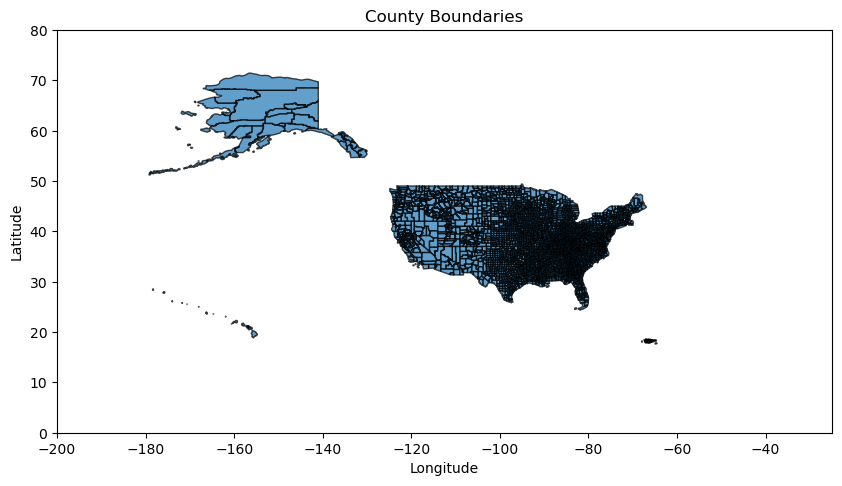

In [21]:
# Plot the counties

ax = counties.plot(figsize=(10, 10), alpha=0.7, edgecolor='black')

# Set y and x-axis limits
plt.xlim(-200, -25)
plt.ylim(0, 80)

# Add labes and titles
plt.title('County Boundaries')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Show the plot
plt.show()

<!-- BEGIN QUESTION -->

f. Use the next markdown cell to explain what information you obtained from the preliminary exploration. Use complete sentences.

*Your answer here.*

In the preliminary exploration of the counties' geo-dataframe, I began by using the head() method to preview the first few rows of the data. This gave me a quick overview of the information contained in each column.

Next, I examined the data types of each column using the dtypes attribute, which helped me understand the nature of the data (e.g., numeric, categorical, etc.). During this step, I also identified a column that contained the geometry data.

I then checked the geo-dataframe's Coordinate Reference System (CRS) and confirmed that it was using EPSG:4269.

Finally, I visualized the data by plotting the map to check if it is complete and ensure it accurately represented the geographic boundaries.

<!-- END QUESTION -->

### 6.B. Cleaning

Simplify column names as needed.

In [22]:
# Replace spaces with underscores and convert to lowercase
counties.columns=counties.columns.str.replace(' ','_').str.lower()

In [23]:
# Convert 'statefp' to a numeric type
counties['statefp']= pd.to_numeric(counties['statefp'])

### 6.C. Data selection

Select all the counties for the state of New York in a new variable `ny_counties` and plot them.

NY FIPS Codes = 36 

Reference: https://www2.census.gov/geo/pdfs/maps-data/maps/reference/us_regdiv.pdf


In [88]:
# Filter to select counties in New York
ny_counties=counties[counties['statefp']==36]

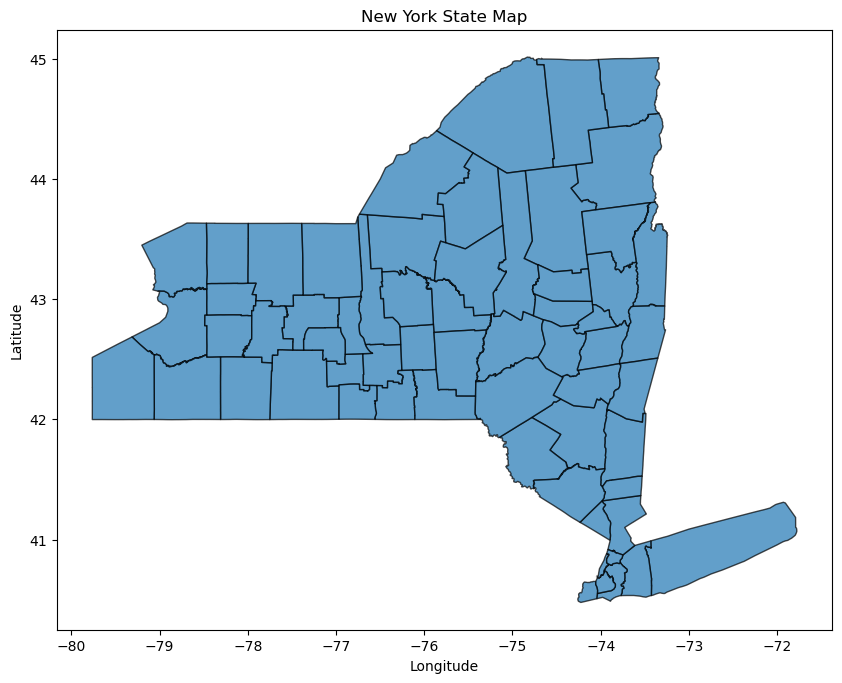

In [89]:
# Plot New York state 

x = ny_counties.plot(figsize=(10, 10), alpha=0.7, edgecolor='black')

# Add labes and titles
plt.title('New York State Map')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Show the plot
plt.show()

## 7 Merging

The goal of this section is to create a single dataframe with the number of spills per county and the corresponding geometries for each county.

### 7.A. Explore data

In the next cells:

a. Print the names of counties in `ny_counties`, without repetition.

b. Print the names of counties in `spills_per_county`, without repetition. Examine the differences in the outputs.


In [26]:
# Find the unique counties in spills_per_county
unique_county_geom=ny_counties['name'].unique()

# View output
print(unique_county_geom)

['Steuben' 'Saratoga' 'Allegany' 'Oswego' 'Ulster' 'St. Lawrence'
 'Schuyler' 'Essex' 'Suffolk' 'Hamilton' 'Dutchess' 'Otsego' 'Tompkins'
 'Albany' 'Cayuga' 'Greene' 'Herkimer' 'Warren' 'Jefferson' 'Clinton'
 'Nassau' 'Madison' 'Washington' 'Westchester' 'Lewis' 'Ontario'
 'Cortland' 'Richmond' 'Erie' 'Putnam' 'Montgomery' 'Sullivan' 'Orleans'
 'Oneida' 'Cattaraugus' 'Yates' 'Tioga' 'Monroe' 'Schoharie' 'Broome'
 'Rensselaer' 'Seneca' 'Queens' 'Genesee' 'Wayne' 'Niagara' 'Kings'
 'Chemung' 'Wyoming' 'New York' 'Columbia' 'Chautauqua' 'Franklin'
 'Onondaga' 'Chenango' 'Fulton' 'Rockland' 'Livingston' 'Delaware'
 'Orange' 'Schenectady' 'Bronx']


In [27]:
# Find the unique counties in spills_per_county
unique_county_spills=spills_per_county['county'].unique()

# View output
print(unique_county_spills)

['Westchester' 'Suffolk' 'Nassau' 'Orange' 'Queens' 'Erie' 'Monroe'
 'Albany' 'Onondaga' 'Kings' 'New York' 'Rockland' 'Ulster' 'Saratoga'
 'Dutchess' 'Bronx' 'Putnam' 'Oneida' 'Jefferson' 'Rensselaer'
 'Washington' 'Niagara' 'Sullivan' 'Warren' 'Schenectady' 'Broome'
 'Steuben' 'Oswego' 'Ontario' 'St Lawrence' 'Montgomery' 'Columbia'
 'Livingston' 'Herkimer' 'Clinton' 'Essex' 'Chautauqua' 'Richmond'
 'Genesee' 'Cattaraugus' 'Franklin' 'Madison' 'Lewis' 'Delaware' 'Greene'
 'Wayne' 'Chenango' 'Tompkins' 'Cortland' 'Otsego' 'Schoharie' 'Fulton'
 'Chemung' 'Allegany' 'Tioga' 'Cayuga' 'Seneca' 'Wyoming' 'Orleans'
 'Schuyler' 'Hamilton' 'New Jersey - Region 2' 'Yates'
 'Tuscarora Indian Reservation']


Although the counties in spills_per_county and ny_counties largely overlap, there are some counties present in spills_per_county that do not appear in ny_counties. This is because the spills_per_county dataframe includes additional regions, such as Indian reservation areas, and extends beyond New York, covering parts of New Jersey and even Canada.



c. Which are the county names that are in `spills_per_county`, but not in `ny_counties`? Your answer should be a list of strings
HINT: You can use the `numpy` function [`setdiff1d()`](https://numpy.org/doc/stable/reference/generated/numpy.setdiff1d.html), pay attention to the example in the documentation. Store your answer in the `diff_names` variable. 



In [28]:
# Use setdiff1d() to find counties in spills_per_county but not in ny_counties
diff_names_spills = np.setdiff1d(unique_county_spills, unique_county_geom)

# Output the results
diff_names_spills

array(['New Jersey - Region 2', 'St Lawrence',
       'Tuscarora Indian Reservation'], dtype=object)


d. Which are the county names that are in `ny_counties`, but not in `spills_per_county`? Your answer should be a list of strings.


In [29]:
# Use setdiff1d() to find counties in ny_counties but not in spills_per_county
diff_names_ny = np.setdiff1d(unique_county_geom,unique_county_spills)

# Output the results
diff_names_ny

array(['St. Lawrence'], dtype=object)




e. What is the number of spills in 'Tuscarora Indian Reservation'?


In [30]:
# Find the number of spills in 'Tuscarora Indian Reservation'

n_spill_tuscarora= spills_per_county[spills_per_county['county']=='Tuscarora Indian Reservation'].n_spills

print(n_spill_tuscarora)

63    1
Name: n_spills, dtype: int64


### 7.B. Data updates

In the next cell, update 'St Lawrence' to 'St. Lawrence' in `spills_per_county` data frame and use an `assert` statement to verify that the update was successful.

You may add cells if needed.

In [31]:
# Replace 'St Lawrence' to 'St. Lawrence' in spills_per_county
spills_per_county['county'] = spills_per_county['county'].replace('St Lawrence', 'St. Lawrence')

In [32]:
# Assert that the update was successful 
assert spills_per_county['county'].isin(['St. Lawrence']).any()

### 7.C. Merge

In the following cells:

a. Use this cell to make any other updates needed for making an inner join of the `spills_per_county` and `ny_counties`. 

b. Over-write `ny_counties` as the  inner join of the `spills_per_county` and `ny_counties` dataframes.


In [90]:
# Rename column 'name' to 'county'

ny_counties=ny_counties.rename(columns={'name': 'county'})

In [91]:
# Perform an inner join between spills_per_county and ny_counties on the common column

ny_counties = pd.merge(spills_per_county, ny_counties, on='county', how='inner')


From our previous exploration we know that Tuscarora Indian Reservation will not be in the join. Tuscarora Indian Reservation is located within Niagara county. 

c. Since the Tuscarora Indian Reservation does not appear in the `ny_counties` dataframe, add one spill to Niagara county. Add the cells you need to make this update **and** verify that the dataframe was updated.

In [92]:
# Add spill from Tuscarora Indian Reservation to Niagara County 

ny_counties.loc[ny_counties['county'] == 'Niagara', 'n_spills'] += 1

# Check results, there should be 89 spills
print(ny_counties[ny_counties['county'] == 'Niagara'].n_spills)

21    89
Name: n_spills, dtype: int64


<!-- BEGIN QUESTION -->

## 8. Map
a. Create a choropleth map of the number of petroleum spills per county in the state of New York in 2023. 
Your map should be polished and have (at least) the following updates:
- a legend indicating the number of spills
- an updated color map
- a title 
- no axis
- an [annotation](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.annotate.html) with the data source (New York State Department of Environmental Conservation) and date of access.



In [86]:
# Convert it to a GeoDataFrame
ny_counties_geo = gpd.GeoDataFrame(ny_counties, geometry='geometry')

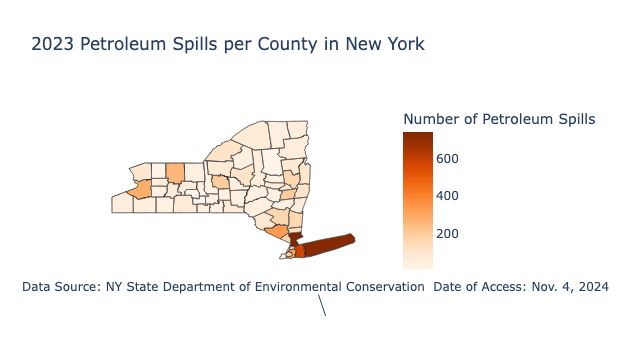

In [87]:
# Create the choropleth map for ny_counties
fig = px.choropleth(ny_counties_geo,
                    geojson=ny_counties_geo.geometry.__geo_interface__,  
                    locations=ny_counties_geo.index,  # Use index for each state
                    color='n_spills',  # Color by the number of spills

# Update color map, title, legend label                 
                    color_continuous_scale="Oranges",  
                    title="2023 Petroleum Spills per County in New York",
                    labels={'n_spills': 'Number of Petroleum Spills'}
)

#  Fit bounds and remove axis
fig.update_geos(fitbounds="locations", visible=False)

# Add annotation: references and date of access
fig.add_annotation(
    x=0.8,  # x-position of the annotation 
    y=-0.2,  # y-position
    text="Data Source: NY State Department of Environmental Conservation \nDate of Access: Nov. 4, 2024",
    align="center"
)

# Show the map
fig.show()

<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

b. Write a figure description for the map, including tha names of the top 3 counties with the most petroleum spills. If you need to do additional data analysis to include relevant information from the data, you may include additional code cells here.

In [105]:
# Find the top three counties with the most oil spills

top_counties = ny_counties.sort_values(by='n_spills', ascending=False).loc[0:2]
top_counties.head()

,county,n_spills,statefp,countyfp,countyns,geoid,geoidfq,namelsad,lsad,classfp,mtfcc,csafp,cbsafp,metdivfp,funcstat,aland,awater,intptlat,intptlon,geometry
0,Westchester,743,36,119,00974157,36119,0500000US36119,Westchester County,06,H1,G4020,408,35620,35614,A,1115811940,179391718,+41.1526862,-073.7457526,"POLYGON ((-73.65762 40.98550, -73.65739 40.985..."
1,Suffolk,723,36,103,00974149,36103,0500000US36103,Suffolk County,06,H1,G4020,408,35620,35004,A,2359277313,3787417976,+40.9435540,-072.6922183,"POLYGON ((-71.80938 41.20323, -71.79115 41.184..."
2,Nassau,576,36,059,00974128,36059,0500000US36059,Nassau County,06,H1,G4020,408,35620,35004,A,736960644,437290665,+40.7296118,-073.5894144,"POLYGON ((-73.78019 40.82640, -73.77498 40.830..."


The map above shows the number of petroleum spills per county in the state of New York for the year 2023. The data was sourced from the New York State Department of Environmental Conservation (NYDEC).
The choropleth map uses a yellow-to-red color gradient, where yellow represents counties with fewer spills, and red represents counties with higher spill counts. The Southeast of New York shows it has been mostly impacted by the oil spills.

The top three counties with the most spills are:
| County | # Spills |
| ------ | ----------- | 
| Westchester | 743 |
| Suffolk | 723 |
| Nassau | 576 |
